# Tarea N°3 Grupo N°4 Machine Learning Avanzado

<div>
<img src="https://i.ibb.co/v3CvVz9/udd-short.png" width="150"/>
    <br>
    <strong>Universidad del Desarrollo</strong><br>
    <em>Profesor: Tomás Fontecilla </em><br>

</div>

*17 de diciembre de 2024*

**Nombre Estudiantes**:  
- Gabriel Álvarez Martínez-Conde
- Constanza Perez Pulido
- Cristian Pizarro Véliz
- Camilo Rivera Verdugo

# 1. Introducción
En este laboratorio se explorarán y aplicarán arquitecturas avanzadas de Redes Neuronales Recurrentes y Recursivas, específicamente LSTM y Autoencoders, en dos contextos distintos: series temporales y procesamiento de imágenes. Se ajustará un modelo LSTM para analizar datos de producción láctea y el índice IPSA de la bolsa de Santiago, incorporando predicciones a futuro. Paralelamente, se implementará un Autoencoder para limpiar imágenes y extraer texto de ellas, empleando una base de datos proporcionada por Kaggle. El informe incluirá análisis descriptivo, validación y presentación de resultados, además de una evaluación visual del desempeño del Autoencoder en imágenes propias.

# 2. Objetivo 
Aplicar arquitecturas avanzadas de aprendizaje profundo para resolver problemas específicos en dos dominios: series temporales y procesamiento de imágenes. 
- En series temporales, ajustar un modelo LSTM para analizar tendencias y realizar predicciones de 3 meses en datos de producción láctea y el índice IPSA de la Bolsa de Santiago. 
- En procesamiento de imágenes, desarrollar un Autoencoder para limpiar imágenes y extraer texto, validando su desempeño con una base de datos de Kaggle y una imagen propia.

# 3. Metodología

Para la aplicación de los modelos será necesario:

- Preprocesar y analizar los datos de producción láctea, IPSA e imágenes de Kaggle.
- Realizar análisis descriptivo, incluyendo visualizaciones de series temporales y exploración de imágenes.
- Ajustar un modelo LSTM para capturar patrones y realizar predicciones a 3 meses en las series temporales.
- Implementar un Autoencoder para limpiar imágenes y extraer texto, probándolo con imágenes propias.
- Validar los modelos mediante métricas y comparaciones visuales.
- Presentar los resultados en un informe con gráficos, análisis y conclusiones.

## 3.1. Importación de paquetes y librerías

Para realizar los análisis relacionados al cumplimiento del objetivo de este laboratorio es necesario utilizar las librerías y paquetes que se describen a continuación:

In [10]:
# !pip install -r requirements.txt
# !pip install openpyxl

In [13]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from tensorflow.keras.regularizers import L2
from sklearn.model_selection import train_test_split
from tensorflow.keras.losses import MeanSquaredLogarithmicError
from statsmodels.tsa.seasonal import seasonal_decompose
import math
from pandas import read_csv
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error

# 4. Resultados: 

## 4.1 Unidad 1: Long Short-Term Memory para 'Milk-Data'. 
En esta unidad, desarrollamos un modelo LSTM para analizar y predecir la producción mensual de leche utilizando datos históricos. El proceso incluyó la normalización de los datos, la división en conjuntos de entrenamiento y prueba, y la creación de un modelo LSTM con múltiples capas para capturar patrones temporales y estacionales en los datos. 

Entrenamos el modelo durante 200 épocas, aplicando técnicas de regularización como Early Stopping para evitar el sobreajuste. Evaluamos el rendimiento mediante métricas como RMSE, obteniendo valores bajos tanto en entrenamiento (0.106) como en prueba (0.111), lo que evidencia su precisión. Finalmente, realizamos predicciones para los primeros tres meses de 1976, mostrando resultados consistentes con las tendencias del dataset.

#### Cargamos los datos: 

In [6]:
# Cargar datos de producción láctea
milk_data = pd.read_csv('datos_red1/monthly_milk_production.csv')
milk_data['Date'] = pd.to_datetime(milk_data['Date'])
milk_data.set_index('Date', inplace=True)
print(milk_data.head())

            Production
Date                  
1962-01-01         589
1962-02-01         561
1962-03-01         640
1962-04-01         656
1962-05-01         727


In [7]:
print(milk_data.tail())

            Production
Date                  
1975-08-01         858
1975-09-01         817
1975-10-01         827
1975-11-01         797
1975-12-01         843


In [8]:
milk_data.isnull().any()

Production    False
dtype: bool

#### Análisis descriptivo:

Antes de proceder con la predicción mediante modelos LSTM, es importante realizar un análisis descriptivo de los datos para comprender su comportamiento y características principales. Este análisis permite identificar tendencias, patrones estacionales y la distribución general de la producción mensual de leche, proporcionando una base para el modelado y la interpretación de resultados. A continuación, se presentan gráficos que resumen estas observaciones clave.

       Production
count  168.000000
mean   754.708333
std    102.204524
min    553.000000
25%    677.750000
50%    761.000000
75%    824.500000
max    969.000000


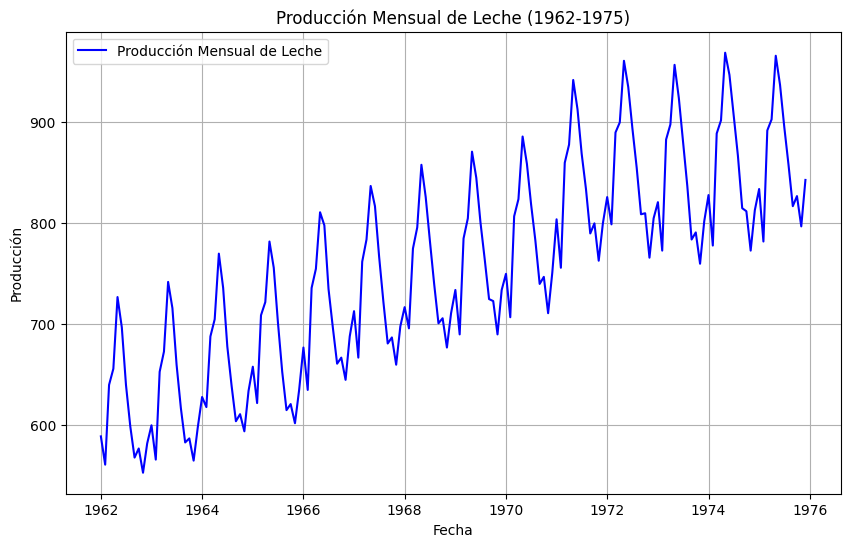

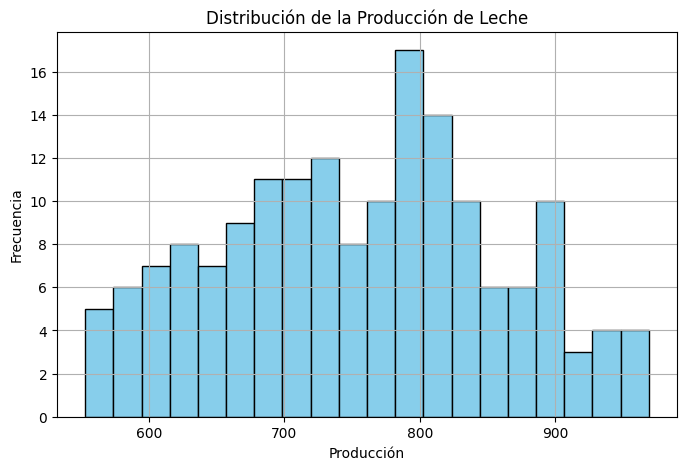

In [9]:
# Generar análisis descriptivo
description = milk_data.describe()

print(description)

# Graficar tres visualizaciones clave
plt.figure(figsize=(10, 6))
plt.plot(milk_data.index, milk_data['Production'], label='Producción Mensual de Leche', color='blue')
plt.title('Producción Mensual de Leche (1962-1975)')
plt.xlabel('Fecha')
plt.ylabel('Producción')
plt.legend()
plt.grid(True)
plt.show()

# Histograma de la producción de leche
plt.figure(figsize=(8, 5))
plt.hist(milk_data['Production'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribución de la Producción de Leche')
plt.xlabel('Producción')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

**Promedio y distribución:** La producción promedio mensual es de aproximadamente 755 unidades, con una producción mínima de 553 y máxima de 969. Los datos están distribuidos con una desviación estándar de 102.

- **Serie Temporal:** La producción mensual de leche muestra patrones cíclicos y tendencias de largo plazo, indicando estacionalidad.
- **Histograma:** La distribución de la producción está centrada cerca de su media, lo que sugiere una variabilidad moderada.

#### Descomposición de la serie: 

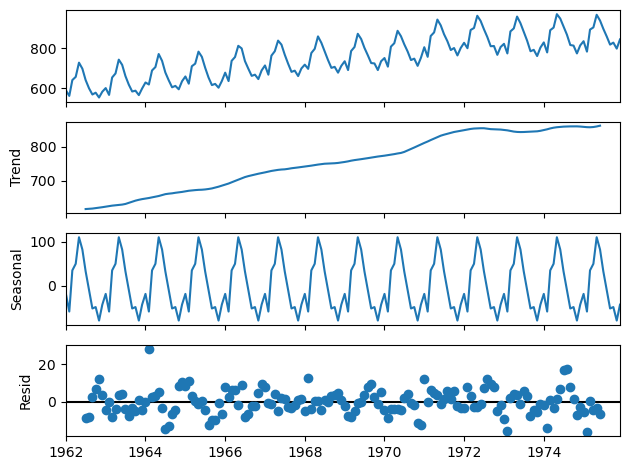

In [270]:
descomposicion = seasonal_decompose(milk_data, model='additive', period=12)

descomposicion.plot()
plt.show()

tendencia = descomposicion.trend
estacionalidad = descomposicion.seasonal
ruido = descomposicion.resid

- **Descomposición de Series Temporales:** La descomposición muestra una tendencia creciente y estacionalidad clara, lo que es clave para modelar con LSTM

#### Procesamiento de datos. Se generan los datos de entrenamiento y testeo. 

In [221]:
# Preprocesar datos
scaler = MinMaxScaler(feature_range=(0, 1))
milk_scaled = scaler.fit_transform(milk_data)

## Entrenamiento y Testeo
train_size = int(len(milk_scaled) * 0.67)
test_size = len(milk_scaled) - train_size
train, test = milk_scaled[0:train_size,:], milk_scaled[train_size:len(milk_scaled),:]

# Generamos X e Y 
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data)-time_step-1):
        a = data[i:(i+time_step), 0]
        X.append(a)
        Y.append(data[i + time_step, 0])
    return np.array(X), np.array(Y)
    
time_step=1
X_train, Y_train = create_dataset(train, time_step)
X_test, Y_test = create_dataset(test, time_step)

# Reshape para LSTM
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

#### Estructura del modelo y entrenamiento: 

Epoch 1/200


C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


88/88 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.1051 - mse: 0.1051 - val_loss: 0.0402 - val_mse: 0.0402
Epoch 2/200
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0192 - mse: 0.0192 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 3/200
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0159 - mse: 0.0159 - val_loss: 0.0235 - val_mse: 0.0235
Epoch 4/200
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0130 - mse: 0.0130 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 5/200
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150 - mse: 0.0150 - val_loss: 0.0136 - val_mse: 0.0136
Epoch 6/200
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0127 - mse: 0.0127 - val_loss: 0.0123 - val_mse: 0.0123
Epoch 7/200
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0158 - val_mse: 0.0158
Epoch 8/200
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0118 - mse: 0.0118 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 9/200
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0111 - mse: 0.0

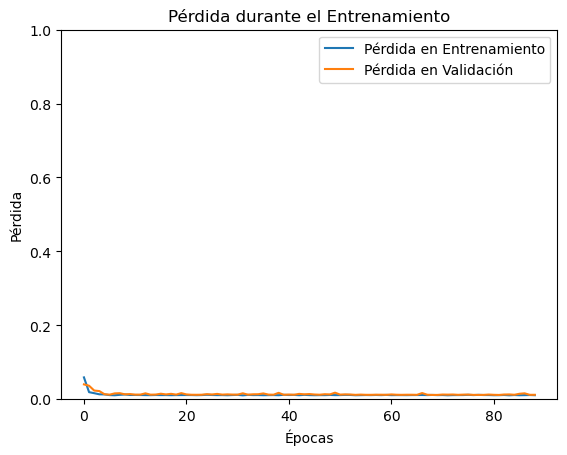

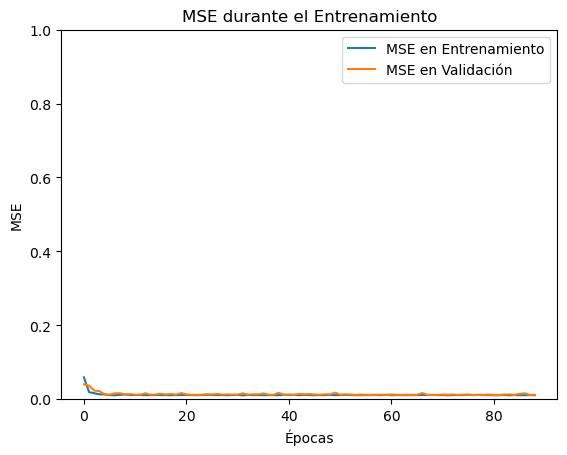

In [222]:
# Crear modelo LSTM

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step,1)))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

# Entrenar modelo
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
history = model.fit(X_train, Y_train, epochs=200, batch_size=1, verbose=1, validation_split = 0.2, callbacks=[early_stopping])

# Graficamos la pérdida
plt.plot(history.history['loss'], label='Pérdida en Entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida en Validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.ylim(0, 1)
plt.legend()
plt.title('Pérdida durante el Entrenamiento')
plt.show()

# Graficamos la MSE
plt.plot(history.history['mse'], label='MSE en Entrenamiento')
plt.plot(history.history['val_mse'], label='MSE en Validación')
plt.xlabel('Épocas')
plt.ylabel('MSE')
plt.ylim(0, 1)
plt.legend()
plt.title('MSE durante el Entrenamiento')
plt.show()

#### Evaluación del modelo:

In [223]:
# Predicciones
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

train_rmse = math.sqrt(mean_squared_error(Y_train, train_pred))
test_rmse = math.sqrt(mean_squared_error(Y_test, test_pred))

# Print RMSE
print('Train RMSE: %.3f RMSE' % (train_rmse))
print('Test RMSE: %.3f RMSE' % (test_rmse)) 

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Train RMSE: 0.104 RMSE
Test RMSE: 0.109 RMSE


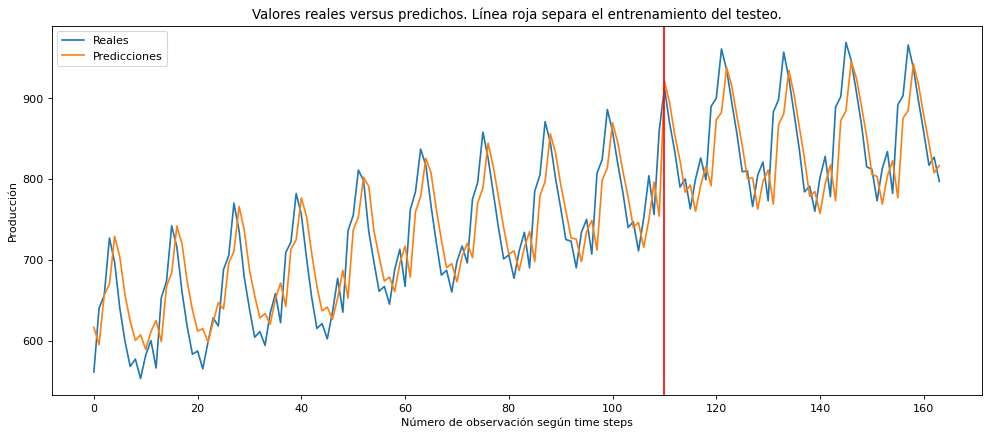

In [249]:
def plot_result(Y_train, Y_test, train_pred, test_pred):
    actual = np.append(Y_train, Y_test)
    predictions = np.append(train_pred, test_pred)
    rows = len(actual)
    plt.figure(figsize=(15, 6), dpi=80)
    plt.plot(range(rows), actual)
    plt.plot(range(rows), predictions)
    plt.axvline(x=len(Y_train), color='r')
    plt.legend(['Reales', 'Predicciones'])
    plt.xlabel('Número de observación según time steps')
    plt.ylabel('Producción')
    plt.title('Valores reales versus predichos. Línea roja separa el entrenamiento del testeo.')


## Volvemos a la escala original para mejorar la interpretación de resultados 
train_pred_inversed = scaler.inverse_transform(train_pred)
test_pred_inversed = scaler.inverse_transform(test_pred)
Y_train = Y_train.reshape(-1, 1)
Y_test = Y_test.reshape(-1, 1)
Y_train_inversed = scaler.inverse_transform(Y_train)
Y_test_inversed = scaler.inverse_transform(Y_test)

#Plot result
plot_result(Y_train_inversed, Y_test_inversed, train_pred_inversed, test_pred_inversed)

#### Predicción 3 meses en adelante: 

In [248]:
## Accedemos al último valor (reescalado) 
last_value = test[-1]  
last_value_inversed = last_value.reshape(-1, 1)
last_value_inversed = scaler.inverse_transform(last_value_inversed)

# Predecimos el valor para el primer (siguiente) mes y lo reescalamos (Enero de 1976)
input_data = last_value.reshape(1, 1, 1) 
next_pred = model.predict(input_data)  
next_pred_inversed = scaler.inverse_transform(next_pred)

# Predecimos el valor para el segundo mes y lo reescalamos (Febrero de 1976)
input_data = next_pred.reshape(1, 1, 1)
next_pred_2 = model.predict(input_data)
next_pred_2_inversed = scaler.inverse_transform(next_pred_2)

# Predecimos el valor para el tercer mes y lo reescalamos (Marzo de 1976)
input_data = next_pred_2.reshape(1, 1, 1)
next_pred_3 = model.predict(input_data)
next_pred_3_inversed = scaler.inverse_transform(next_pred_3)

print(last_value_inversed)
print(next_pred_inversed)
print(next_pred_2_inversed)
print(next_pred_3_inversed)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[843.]]
[[830.84375]]
[[819.93835]]
[[810.19165]]


El modelo LSTM desarrollado mostró un buen desempeño en la predicción de la producción mensual de leche, alcanzando un RMSE de 0.104 en el conjunto de entrenamiento y 0.109 en el conjunto de prueba, lo que indica un bajo nivel de error en ambas fases. 

Durante el entrenamiento, la pérdida y el error cuadrático medio (MSE) disminuyeron de manera consistente, mostrando una convergencia adecuada. 

- Las predicciones realizadas para los tres meses posteriores al período de prueba ``(enero, febrero y marzo de 1976)`` mostraron valores coherentes con la tendencia observada en los datos históricos: 830, 819 y 810 unidades, respectivamente. Estos resultados validan la capacidad del modelo para capturar patrones estacionales y realizar predicciones precisas a corto plazo.

### ¿Y si realizamos el proceso utilizando el Δ (delta)? 

In [303]:
milk_data = pd.read_csv('datos_red1/monthly_milk_production.csv')
milk_data['Date'] = pd.to_datetime(milk_data['Date'])
milk_data.set_index('Date', inplace=True)
milk_data['Production'] = milk_data['Production'].diff()
milk_data = milk_data.dropna()
print(milk_data.head())

            Production
Date                  
1962-02-01       -28.0
1962-03-01        79.0
1962-04-01        16.0
1962-05-01        71.0
1962-06-01       -30.0


In [311]:
print(milk_data.tail())

            Production
Date                  
1975-08-01       -38.0
1975-09-01       -41.0
1975-10-01        10.0
1975-11-01       -30.0
1975-12-01        46.0


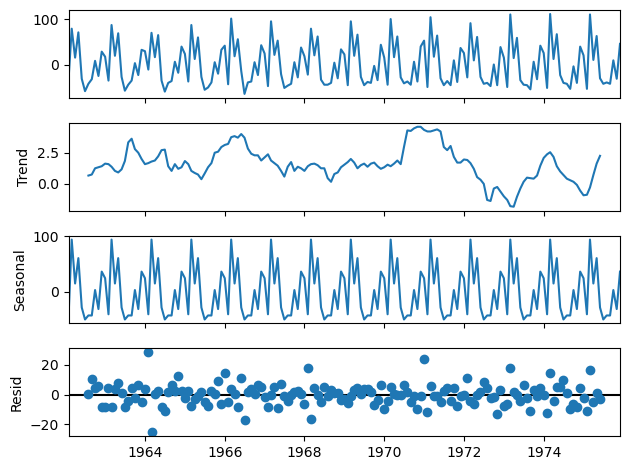

In [304]:
descomposicion = seasonal_decompose(milk_data, model='additive', period=12)

descomposicion.plot()
plt.show()

tendencia = descomposicion.trend
estacionalidad = descomposicion.seasonal
ruido = descomposicion.resid

In [305]:
# Preprocesar datos
scaler = MinMaxScaler(feature_range=(0, 1))
milk_scaled = scaler.fit_transform(milk_data)

## Entrenamiento y Testeo
train_size = int(len(milk_scaled) * 0.67)
test_size = len(milk_scaled) - train_size
train, test = milk_scaled[0:train_size,:], milk_scaled[train_size:len(milk_scaled),:]

# Generamos X e Y 
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data)-time_step-1):
        a = data[i:(i+time_step), 0]
        X.append(a)
        Y.append(data[i + time_step, 0])
    return np.array(X), np.array(Y)
    
time_step=1
X_train, Y_train = create_dataset(train, time_step)
X_test, Y_test = create_dataset(test, time_step)

# Reshape para LSTM
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

Epoch 1/200


C:\Users\Usuario\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


87/87 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.2036 - mse: 0.2036 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 2/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0743 - mse: 0.0743 - val_loss: 0.0817 - val_mse: 0.0817
Epoch 3/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0593 - mse: 0.0593 - val_loss: 0.0795 - val_mse: 0.0795
Epoch 4/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0648 - mse: 0.0648 - val_loss: 0.0784 - val_mse: 0.0784
Epoch 5/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0583 - mse: 0.0583 - val_loss: 0.0819 - val_mse: 0.0819
Epoch 6/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0624 - mse: 0.0624 - val_loss: 0.0772 - val_mse: 0.0772
Epoch 7/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0589 - mse: 0.0589 - val_loss: 0.0765 - val_mse: 0.0765
Epoch 8/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0670 - mse: 0.0670 - val_loss: 0.0777 - val_mse: 0.0777
Epoch 9/200
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0656 - mse: 0.0

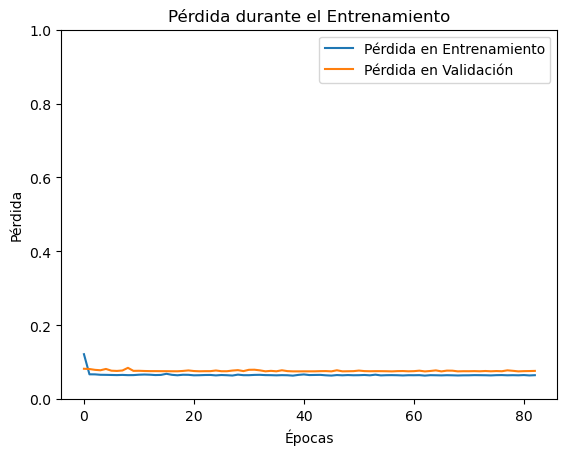

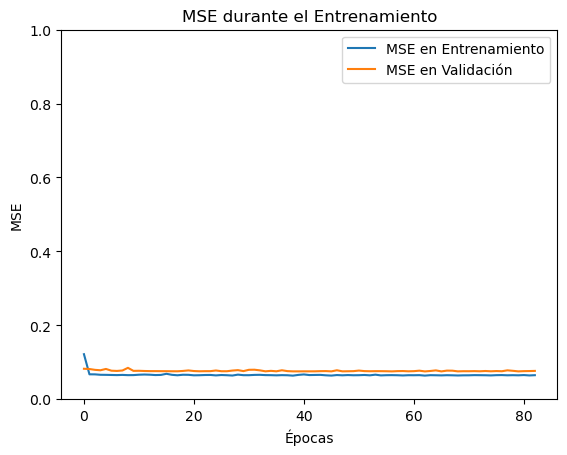

In [306]:
# Crear modelo LSTM

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step,1)))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

# Entrenar modelo
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
history = model.fit(X_train, Y_train, epochs=200, batch_size=1, verbose=1, validation_split = 0.2, callbacks=[early_stopping])

# Graficamos la pérdida
plt.plot(history.history['loss'], label='Pérdida en Entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida en Validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.ylim(0, 1)
plt.legend()
plt.title('Pérdida durante el Entrenamiento')
plt.show()

# Graficamos la MSE
plt.plot(history.history['mse'], label='MSE en Entrenamiento')
plt.plot(history.history['val_mse'], label='MSE en Validación')
plt.xlabel('Épocas')
plt.ylabel('MSE')
plt.ylim(0, 1)
plt.legend()
plt.title('MSE durante el Entrenamiento')
plt.show()

In [307]:
# Predicciones
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

train_rmse = math.sqrt(mean_squared_error(Y_train, train_pred))
test_rmse = math.sqrt(mean_squared_error(Y_test, test_pred))

# Print RMSE
print('Train RMSE: %.3f RMSE' % (train_rmse))
print('Test RMSE: %.3f RMSE' % (test_rmse)) 

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Train RMSE: 0.259 RMSE
Test RMSE: 0.268 RMSE


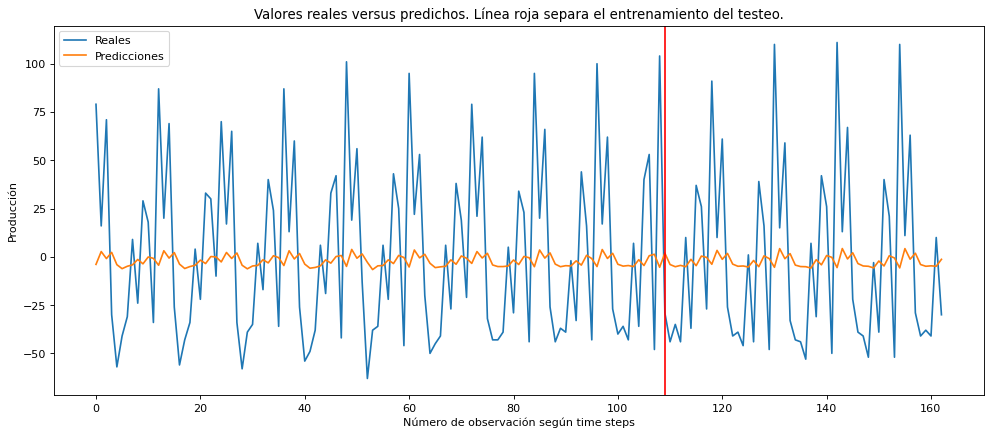

In [308]:
def plot_result(Y_train, Y_test, train_pred, test_pred):
    actual = np.append(Y_train, Y_test)
    predictions = np.append(train_pred, test_pred)
    rows = len(actual)
    plt.figure(figsize=(15, 6), dpi=80)
    plt.plot(range(rows), actual)
    plt.plot(range(rows), predictions)
    plt.axvline(x=len(Y_train), color='r')
    plt.legend(['Reales', 'Predicciones'])
    plt.xlabel('Número de observación según time steps')
    plt.ylabel('Producción')
    plt.title('Valores reales versus predichos. Línea roja separa el entrenamiento del testeo.')


## Volvemos a la escala original para mejorar la interpretación de resultados 
train_pred_inversed = scaler.inverse_transform(train_pred)
test_pred_inversed = scaler.inverse_transform(test_pred)
Y_train = Y_train.reshape(-1, 1)
Y_test = Y_test.reshape(-1, 1)
Y_train_inversed = scaler.inverse_transform(Y_train)
Y_test_inversed = scaler.inverse_transform(Y_test)

#Plot result
plot_result(Y_train_inversed, Y_test_inversed, train_pred_inversed, test_pred_inversed)

In [309]:
## Accedemos al último valor (reescalado) 
last_value = test[-1]  
last_value_inversed = last_value.reshape(-1, 1)
last_value_inversed = scaler.inverse_transform(last_value_inversed)

# Predecimos el valor para el primer (siguiente) mes y lo reescalamos (Enero de 1976)
input_data = last_value.reshape(1, 1, 1) 
next_pred = model.predict(input_data)  
next_pred_inversed = scaler.inverse_transform(next_pred)

# Predecimos el valor para el segundo mes y lo reescalamos (Febrero de 1976)
input_data = next_pred.reshape(1, 1, 1)
next_pred_2 = model.predict(input_data)
next_pred_2_inversed = scaler.inverse_transform(next_pred_2)

# Predecimos el valor para el tercer mes y lo reescalamos (Marzo de 1976)
input_data = next_pred_2.reshape(1, 1, 1)
next_pred_3 = model.predict(input_data)
next_pred_3_inversed = scaler.inverse_transform(next_pred_3)

print(last_value_inversed)
print(next_pred_inversed)
print(next_pred_2_inversed)
print(next_pred_3_inversed)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
[[46.]]
[[0.9150077]]
[[-1.8999455]]
[[-2.0892408]]


Los resultados no son satisfactorios utilizando el delta de la producción. 

## 4.2 Unidad 1: Long Short-Term Memory para 'IPSA Data'. 

En esta unidad, se utilizarán datos históricos del índice IPSA, obtenidos del Banco Central de Chile, para entrenar un modelo Long Short-Term Memory (LSTM) que permita analizar y predecir su comportamiento futuro. El dataset contiene 431 registros mensuales, desde enero de 1989, con el índice IPSA ajustado al valor base de 1000 en enero de 2003. Esta información refleja la evolución del principal indicador bursátil chileno, proporcionando una base para identificar tendencias y patrones temporales relevantes que serán utilizados en el modelado. A continuación, se realiza un análisis descriptivo inicial de los datos. 

Fuente: https://si3.bcentral.cl/Siete/ES/Siete/Cuadro/CAP_ESTADIST_MACRO/MN_EST_MACRO_IV/PEM_INDBUR/PEM_INDBUR

#### Cargamos los datos: 

In [56]:
# Cargar los datos del nuevo archivo para describir el dataset
ipsa_historico_path = "datos_red1/IPSA_Historico.xlsx"
ipsa_historico_data = pd.read_excel(ipsa_historico_path)

# Mostrar las primeras filas del dataset para entender su estructura
ipsa_historico_data.head(), ipsa_historico_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 431 entries, 0 to 430
Data columns (total 2 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Periodo                           431 non-null    datetime64[ns]
 1   1.IPSA  (índice enero 2003=1000)  431 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 6.9 KB


(     Periodo  1.IPSA  (índice enero 2003=1000)
 0 1989-01-01                             54.44
 1 1989-02-01                             60.57
 2 1989-03-01                             63.64
 3 1989-04-01                             68.44
 4 1989-05-01                             70.72,
 None)

In [57]:
# Renombrar columnas para facilitar el manejo
ipsa_historico_data.rename(columns={"Periodo": "Date", "1.IPSA  (índice enero 2003=1000)": "IPSA"}, inplace=True)

#### Análisis descriptivo

                                Date         IPSA
count                            431   431.000000
mean   2006-11-30 23:43:17.679814400  2668.079582
min              1989-01-01 00:00:00    54.440000
25%              1997-12-16 12:00:00  1006.470000
50%              2006-12-01 00:00:00  2406.260000
75%              2015-11-16 00:00:00  4263.555000
max              2024-11-01 00:00:00  6643.760000
std                              NaN  1869.588183


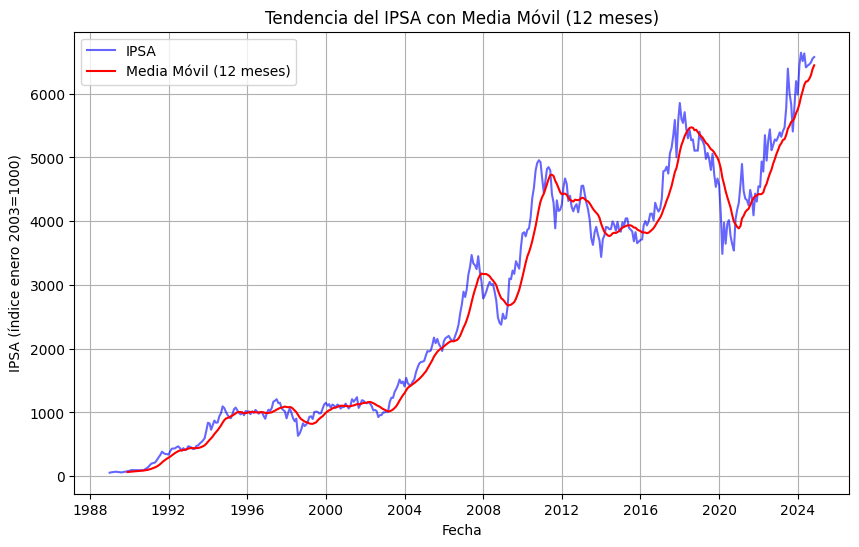

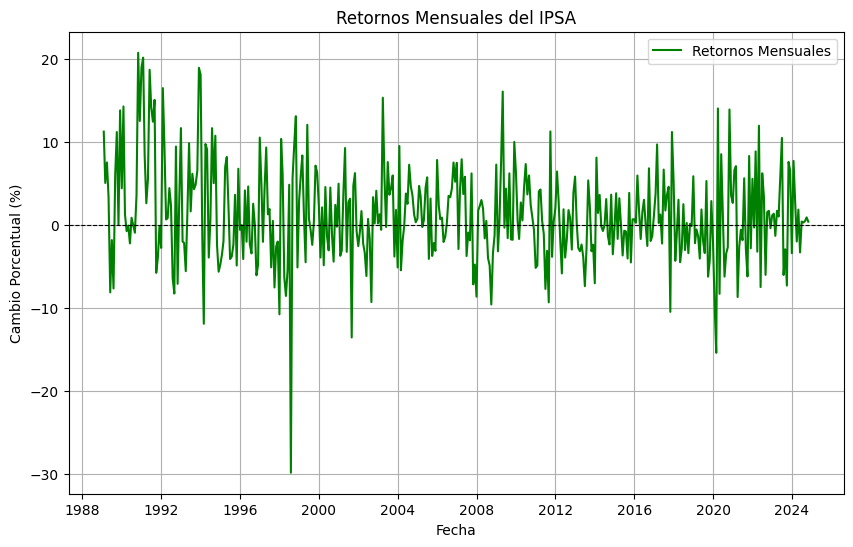

In [58]:
# Generar análisis descriptivo
description = ipsa_historico_data.describe()

print(description)

# Calcular media móvil de 12 meses
ipsa_historico_data['Moving_Avg'] = ipsa_historico_data['IPSA'].rolling(window=12).mean()

# Gráfico de tendencia con media móvil
plt.figure(figsize=(10, 6))
plt.plot(ipsa_historico_data['Date'], ipsa_historico_data['IPSA'], label='IPSA', color='blue', alpha=0.6)
plt.plot(ipsa_historico_data['Date'], ipsa_historico_data['Moving_Avg'], label='Media Móvil (12 meses)', color='red')
plt.title('Tendencia del IPSA con Media Móvil (12 meses)')
plt.xlabel('Fecha')
plt.ylabel('IPSA (índice enero 2003=1000)')
plt.legend()
plt.grid(True)
plt.show()

# Calcular retornos mensuales (cambio porcentual)
ipsa_historico_data['Monthly_Returns'] = ipsa_historico_data['IPSA'].pct_change() * 100

# Gráfico de retornos mensuales
plt.figure(figsize=(10, 6))
plt.plot(ipsa_historico_data['Date'], ipsa_historico_data['Monthly_Returns'], label='Retornos Mensuales', color='green')
plt.axhline(y=0, color='black', linestyle='--', linewidth=0.8)
plt.title('Retornos Mensuales del IPSA')
plt.xlabel('Fecha')
plt.ylabel('Cambio Porcentual (%)')
plt.legend()
plt.grid(True)
plt.show()

- **Tendencia del IPSA con Media Móvil (12 meses):** El gráfico de la evolución del IPSA con una media móvil de 12 meses muestra un patrón de crecimiento sostenido a largo plazo, con algunas fluctuaciones notables en períodos específicos. La media móvil suaviza las variaciones mensuales, resaltando la tendencia propia del índice. En general, se observa un período inicial de estabilización, seguido de un crecimiento acelerado e intermitente desde aproximadamente 2004 hasta la actualidad.

- **Retornos Mensuales del IPSA:**
El análisis de retornos mensuales evidencia la volatilidad del índice, con variaciones significativas en ciertos períodos. Los peaks y caídas reflejan momentos de alta incertidumbre o eventos relevantes en el mercado, aunque los retornos se centran alrededor de un promedio cercano a cero.

#### Descomponemos la serie: 

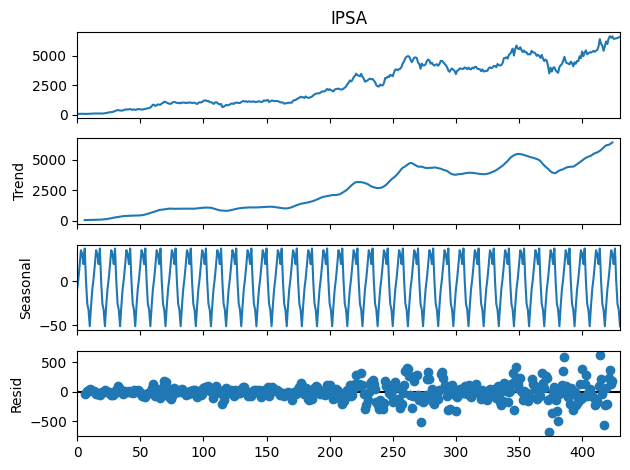

In [59]:
descomposicion = seasonal_decompose(ipsa_historico_data['IPSA'], model='additive', period=12)

descomposicion.plot()
plt.show()

tendencia = descomposicion.trend
estacionalidad = descomposicion.seasonal
ruido = descomposicion.resid

La descomposición de la serie del IPSA revela tres componentes principales:

- **Tendencia:** La tendencia muestra un crecimiento general del IPSA con algunas fases de estabilización y aceleración, especialmente notables después de 2004. Sin embargo, en ciertos períodos, la tendencia se aplanó, reflejando estabilidad o caídas prolongadas en el mercado.

- **Estacionalidad:** El componente estacional muestra un patrón cíclico regular y de alta frecuencia, lo que sugiere una estacionalidad clara con variaciones recurrentes dentro de intervalos específicos.

- **Ruido:** El residuo muestra fluctuaciones moderadas al inicio del período y una mayor dispersión hacia el final, indicando un aumento en la volatilidad no explicada por la tendencia ni la estacionalidad.

#### Procesamiento de datos. Se generan los datos de entrenamiento y testeo. 

In [60]:
# Preprocesar datos
scaler = MinMaxScaler(feature_range=(0, 1))
ipsa_scaled = scaler.fit_transform(ipsa_historico_data[['IPSA']])

# Dividir en conjunto de entrenamiento y prueba (67% entrenamiento, 33% prueba)
train_size = int(len(ipsa_scaled) * 0.67)
test_size = len(ipsa_scaled) - train_size
train, test = ipsa_scaled[0:train_size, :], ipsa_scaled[train_size:len(ipsa_scaled), :]

# Crear X e Y usando ventanas temporales
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[i:(i + time_step), 0]
        X.append(a)
        Y.append(data[i + time_step, 0])
    return np.array(X), np.array(Y)

# Definir tamaño de la ventana temporal
time_step = 12
X_train, Y_train = create_dataset(train, time_step)
X_test, Y_test = create_dataset(test, time_step)

# Reshape para LSTM
X_train = np.reshape(X_train, (X_train.shape[0], time_step, 1)) 
X_test = np.reshape(X_test, (X_test.shape[0], time_step, 1))

#### Estructura del modelo y entrenamiento:

Epoch 1/200


C:\Users\ciriv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.2780 - mse: 0.0763 - val_loss: 0.1858 - val_mse: 0.0066
Epoch 2/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1815 - mse: 0.0095 - val_loss: 0.1779 - val_mse: 0.0269
Epoch 3/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1498 - mse: 0.0050 - val_loss: 0.1315 - val_mse: 0.0044
Epoch 4/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1238 - mse: 0.0020 - val_loss: 0.1116 - val_mse: 0.0049
Epoch 5/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1043 - mse: 0.0020 - val_loss: 0.0940 - val_mse: 0.0046
Epoch 6/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0877 - mse: 0.0020 - val_loss: 0.0795 - val_mse: 0.0045
Epoch 7/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0738 - mse: 0.0020 - val_loss: 0.0674 - val_mse: 0.0045
Epoch 8/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0624 - mse: 0.0021 - val_loss: 0.0576 - val_mse: 0.0049
Epoch 9/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0525 - mse: 0.

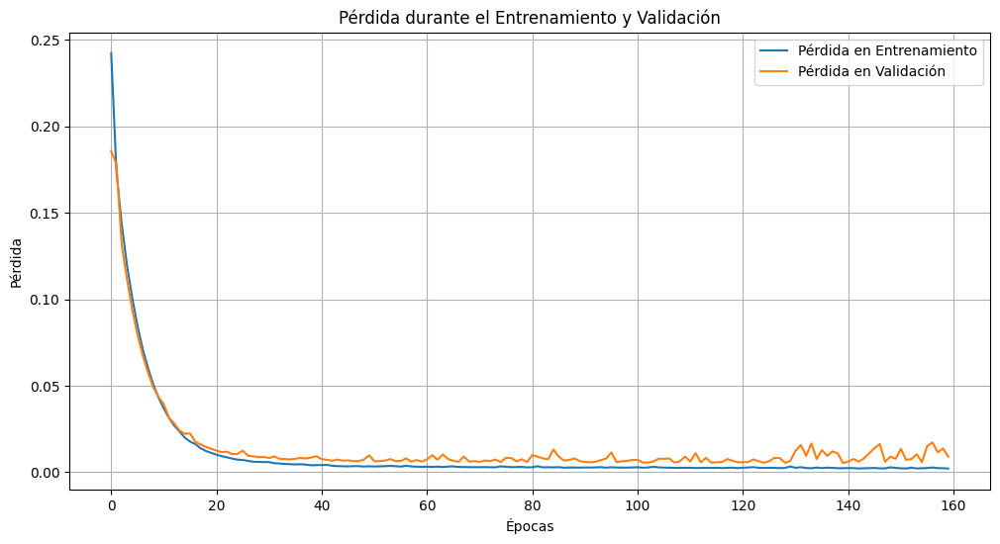

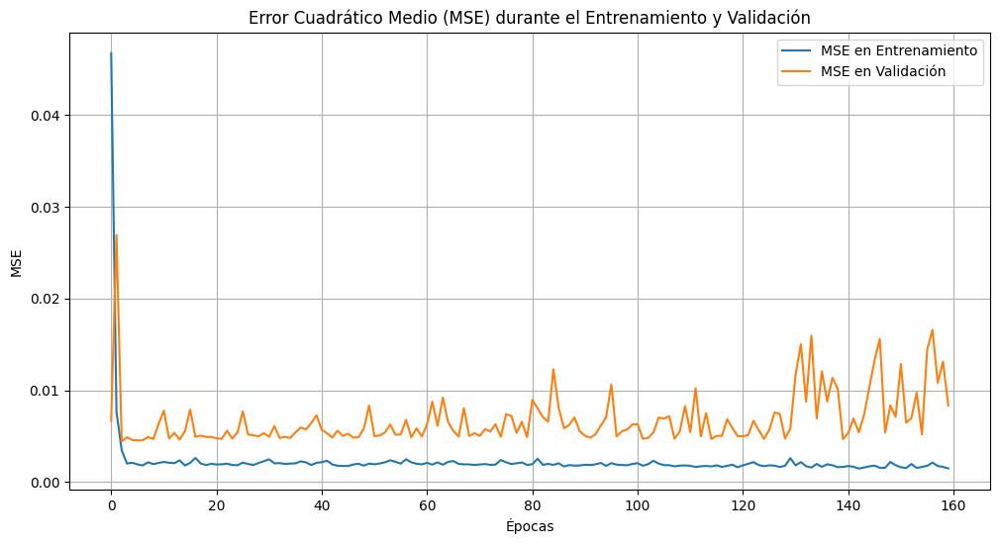

In [71]:
# # Crear modelo LSTM
# model = Sequential()
# model.add(LSTM(64, return_sequences=True, input_shape=(time_step, 1)))
# model.add(Dropout(0.2))  # Dropout 10%
# model.add(LSTM(64, return_sequences=True, kernel_regularizer=L2(0.001)))
# model.add(Dropout(0.2)) # Regularización adicional
# model.add(LSTM(64, return_sequences=False, kernel_regularizer=L2(0.001)))  # Tercera capa LSTM
# model.add(Dense(1))  # Capa de salida

# model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])

# Entrenar modelo y guardar historial
# history = model.fit(X_train, Y_train, epochs=200, batch_size=1, verbose=1, validation_data=(X_test, Y_test))

# Crear modelo LSTM ajustado
model = Sequential()
model.add(LSTM(64, return_sequences=True, input_shape=(time_step, 1), kernel_regularizer=L2(0.002)))
model.add(Dropout(0.2))  # Dropout para reducir sobreajuste
model.add(LSTM(64, return_sequences=False, kernel_regularizer=L2(0.002)))  # Otra capa LSTM con regularización
model.add(Dense(1))  # Capa de salida

# Compilar modelo
model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error', metrics=['mse'])

early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
# Entrenar modelo
history = model.fit(X_train, Y_train, epochs=200, batch_size=16, verbose=1, validation_data=(X_test, Y_test), callbacks=[early_stopping])

# Graficar la pérdida durante el entrenamiento y validación
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Pérdida en Entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida en Validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.title('Pérdida durante el Entrenamiento y Validación')
plt.legend()
plt.grid(True)
plt.show()

# Graficar el MSE durante el entrenamiento y validación
plt.figure(figsize=(12, 6))
plt.plot(history.history['mse'], label='MSE en Entrenamiento')
plt.plot(history.history['val_mse'], label='MSE en Validación')
plt.xlabel('Épocas')
plt.ylabel('MSE')
plt.title('Error Cuadrático Medio (MSE) durante el Entrenamiento y Validación')
plt.legend()
plt.grid(True)
plt.show()

#### Evaluación del modelo

In [72]:
# Realizar predicciones
train_pred = model.predict(X_train)
test_pred = model.predict(X_test)

# Reescalar predicciones y valores reales a su escala original
train_pred_inv = scaler.inverse_transform(train_pred)
test_pred_inv = scaler.inverse_transform(test_pred)
Y_train_inv = scaler.inverse_transform(Y_train.reshape(-1, 1))
Y_test_inv = scaler.inverse_transform(Y_test.reshape(-1, 1))

# Calcular RMSE
train_rmse = math.sqrt(mean_squared_error(Y_train_inv, train_pred_inv))
test_rmse = math.sqrt(mean_squared_error(Y_test_inv, test_pred_inv))

# Imprimir RMSE
print('Train RMSE: %.3f' % train_rmse)
print('Test RMSE: %.3f' % test_rmse)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Train RMSE: 279.933
Test RMSE: 450.024


Luego de varias iteraciones, el modelo final desarrollado logró reducir significativamente el sobreajuste al implementar técnicas de regularización, como Dropout y L2 regularization, y al ajustar parámetros como el tamaño de las capas LSTM, la tasa de aprendizaje y el batch size. Durante el proceso, se probaron múltiples configuraciones de modelos, incrementando gradualmente la regularización para minimizar la brecha entre el error en los conjuntos de entrenamiento y prueba.

El modelo final alcanzó un Train RMSE de 279.933 y un Test RMSE de 450.024, lo que refleja una mejora notable en la generalización respecto a las configuraciones iniciales. Aunque aún persiste cierta discrepancia entre los errores, los resultados obtenidos indican que el modelo es capaz de capturar patrones relevantes en los datos de entrenamiento y predecir razonablemente el comportamiento del índice IPSA en datos no vistos. Estos resultados pueden servir como base para futuras optimizaciones y análisis más profundos sobre las características de los datos.

#### Predicción 3 meses en adelante: 

In [75]:
# Predecir 3 meses adelante secuencialmente
future_predictions = []
input_sequence = X_ipsa[-1]  # Último conjunto de datos como inicio

for _ in range(3):
    # Predecir el siguiente valor
    next_prediction = model.predict(input_sequence.reshape(1, time_step, 1))
    future_predictions.append(next_prediction[0, 0])
    
    # Actualizar la secuencia de entrada con la predicción
    input_sequence = np.append(input_sequence[1:], next_prediction.flatten(), axis=0)

# Reescalar predicciones a valores originales
future_predictions = np.array(future_predictions).reshape(-1, 1)
future_predictions = scaler.inverse_transform(future_predictions)

# Mostrar predicciones
print("Predicciones para los próximos 3 meses:")
print(future_predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Predicciones para los próximos 3 meses:
[[5985.6416]
 [5907.665 ]
 [5828.403 ]]


Las predicciones para los próximos 3 meses muestran una tendencia decreciente en el índice IPSA. Estos resultados reflejan la capacidad del modelo para proyectar el comportamiento futuro del índice, alineándose con los patrones capturados en los datos históricos.

## 4.3 Unidad 2: Autoencoder para limpieza de imágenes 'Dirty Documents'

En esta unidad, se implementa un modelo Autoencoder para la limpieza de imágenes contenidas en el dataset 'Dirty Documents'. Este enfoque busca eliminar el ruido presente en los documentos, preservando el texto subyacente y mejorando su legibilidad. A través de una arquitectura basada en codificación y decodificación, el modelo aprende a reconstruir imágenes limpias a partir de entradas ruidosas, evaluando su desempeño en un conjunto de validación y en imágenes de prueba.

In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from PIL import Image

In [8]:
import zipfile
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

# Ruta del archivo principal
dataset_zip = 'denoising-dirty-documents.zip'

# Carpeta de extracción principal
main_extract_to = 'denoising_dirty_documents_extracted'

# Función para descomprimir archivos .zip
def extract_zip(zip_path, extract_to):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

# Descomprimir el archivo principal
extract_zip(dataset_zip, main_extract_to)

# Extraer los .zip dentro de las subcarpetas del archivo principal
subfolders = ['train.zip', 'train_cleaned.zip', 'test.zip']
for subfolder in subfolders:
    subfolder_path = os.path.join(main_extract_to, subfolder)
    extract_to = os.path.join(main_extract_to, os.path.splitext(subfolder)[0])  # Extraer a una carpeta con el mismo nombre sin .zip
    extract_zip(subfolder_path, extract_to)

# Función para cargar y preprocesar imágenes
def load_images(directory, size=(200, 400)):
    images = []
    for filename in sorted(os.listdir(directory)):  # Ordenar para mantener consistencia
        img_path = os.path.join(directory, filename)
        if os.path.isfile(img_path):
            img = load_img(img_path, target_size=size, color_mode='grayscale')
            img = img_to_array(img) / 255.0  # Normalizar entre 0 y 1
            images.append(img)
    return np.array(images)

# Directorios finales
train_dir = os.path.join(main_extract_to, 'train')
train_cleaned_dir = os.path.join(main_extract_to, 'train_cleaned')
test_dir = os.path.join(main_extract_to, 'test')

# Cargar imágenes desde los directorios finales
X_train_images = load_images(train_dir)
Y_train_images = load_images(train_cleaned_dir)
test_images = load_images(test_dir)

# Confirmar las dimensiones de las imágenes cargadas
print("Número de imágenes de entrenamiento:", X_train_images.shape[0])
print("Número de imágenes limpias de entrenamiento:", Y_train_images.shape[0])
print("Número de imágenes de prueba:", test_images.shape[0])


Número de imágenes de entrenamiento: 144
Número de imágenes limpias de entrenamiento: 144
Número de imágenes de prueba: 72


In [10]:
# Cargar y preprocesar imágenes
def load_images(directory, size=(200, 400)):
    images = []
    for filename in os.listdir(directory):
        img_path = os.path.join(directory, filename)
        if os.path.isfile(img_path):
            img = load_img(img_path, target_size=size, color_mode='grayscale')
            img = img_to_array(img) / 255.0
            images.append(img)
    return np.array(images)

X_train_images = load_images('denoising_dirty_documents_extracted/train')
Y_train_images = load_images('denoising_dirty_documents_extracted/train_cleaned')
test_images = load_images('denoising_dirty_documents_extracted/test')

In [11]:
X_train, X_val, Y_train, Y_val = train_test_split(X_train_images, Y_train_images, test_size=0.25)

In [12]:
# Crear modelo autoencoder
input_img = Input(shape=(200, 400, 1))

# Encoder
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# Decoder
x = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

In [13]:
autoencoder = Model(input_img, decoded)
autoencoder.compile(loss='msle', metrics=['mse'], optimizer='adam')

In [14]:
# Entrenar modelo
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
history = autoencoder.fit(X_train, Y_train, epochs=200, batch_size=32, validation_data=(X_val, Y_val),
                callbacks=[early_stopping])

Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 548ms/step - loss: 0.0681 - mse: 0.1944 - val_loss: 0.0452 - val_mse: 0.1260
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 447ms/step - loss: 0.0406 - mse: 0.1093 - val_loss: 0.0317 - val_mse: 0.0730
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 438ms/step - loss: 0.0322 - mse: 0.0737 - val_loss: 0.0344 - val_mse: 0.0792
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 448ms/step - loss: 0.0345 - mse: 0.0792 - val_loss: 0.0350 - val_mse: 0.0810
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 447ms/step - loss: 0.0346 - mse: 0.0800 - val_loss: 0.0351 - val_mse: 0.0814
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 452ms/step - loss: 0.0349 - mse: 0.0807 - val_loss: 0.0352 - val_mse: 0.0815
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 437ms/step - loss: 0.0353 - mse: 0.0815 - val_loss: 0.0351 - val_mse: 0.0814
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 440ms/step - loss: 0.0352 - mse: 0.0812 - val_loss: 0.0350 - val_mse: 0.0811
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 456ms/step - loss: 0.034

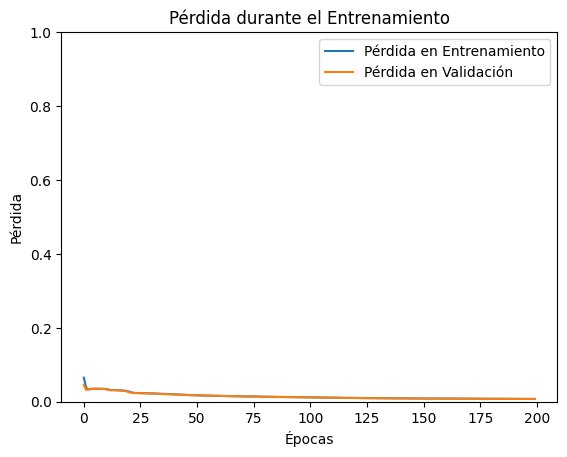

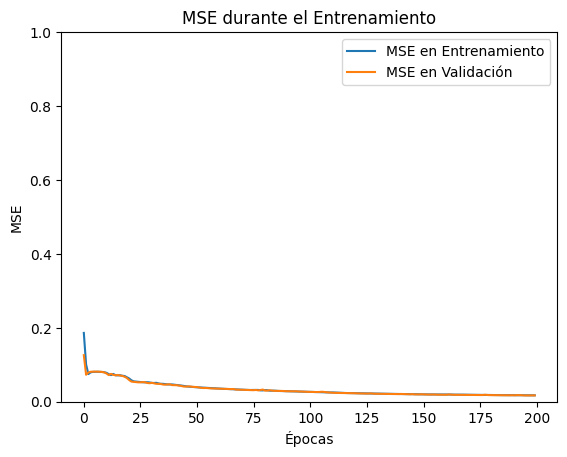

In [15]:
# Graficamos la pérdida
plt.plot(history.history['loss'], label='Pérdida en Entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida en Validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.ylim(0, 1)
plt.legend()
plt.title('Pérdida durante el Entrenamiento')
plt.show()

# Graficamos la MSE
plt.plot(history.history['mse'], label='MSE en Entrenamiento')
plt.plot(history.history['val_mse'], label='MSE en Validación')
plt.xlabel('Épocas')
plt.ylabel('MSE')
plt.ylim(0, 1)
plt.legend()
plt.title('MSE durante el Entrenamiento')
plt.show()

El modelo Autoencoder diseñado para la limpieza de imágenes en el dataset 'Dirty Documents' mostró un desempeño consistente a lo largo del entrenamiento. En las últimas épocas, los valores de pérdida (loss) y MSE alcanzaron niveles bajos y estables, lo que indica que el modelo ha logrado minimizar el error entre las imágenes ruidosas y las limpias esperadas.

Pérdida (loss): En la última época, el valor de pérdida en el conjunto de validación fue de 0.0080, mostrando que el modelo captura de manera eficiente las características necesarias para limpiar las imágenes.
MSE (Mean Squared Error): El error cuadrático medio en el conjunto de validación llegó a 0.0182, reflejando que las diferencias pixel a pixel entre las imágenes reconstruidas y las originales son mínimas.

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 173ms/step


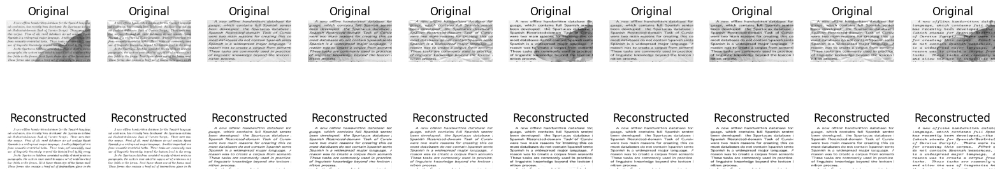

In [16]:
# Mostrar resultados
decoded_imgs = autoencoder.predict(test_images)

n = 10
plt.figure(figsize=(20, 4))
for i in range(n):
    # Imagen original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(test_images[i].reshape(200, 400), cmap='gray')
    plt.title("Original")
    plt.axis('off')

    # Imagen reconstruida
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(200, 400), cmap='gray')
    plt.title("Reconstructed")
    plt.axis('off')
plt.show()

El modelo Autoencoder ha demostrado ser efectivo en la tarea de limpieza de documentos ruidosos, alcanzando un buen balance entre precisión y generalización. La estabilidad de las métricas hacia el final del entrenamiento sugiere que no existe un problema de sobreajuste significativo. Estos resultados indican que el modelo está listo para ser evaluado en imágenes de prueba, donde se espera que mantenga un desempeño similar, mejorando la legibilidad del texto en documentos contaminados por ruido.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


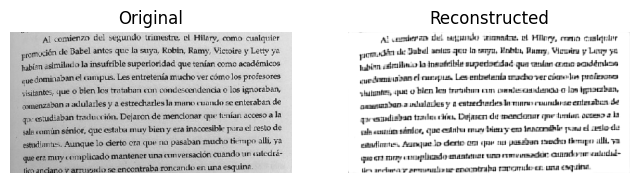

In [24]:
# Función para cargar y preprocesar una imagen personalizada
# Se utiliza una foto de una página de un libro
def process_custom_image(image_path, size=(200, 400)):
    # Cargar la imagen
    img = load_img(image_path, target_size=size, color_mode='grayscale')
    img_array = img_to_array(img) / 255.0  # Normalizar a [0, 1]
    return img_array.reshape(1, size[0], size[1], 1)  # Reshape para entrada del modelo

# Ruta de la imagen personalizada
custom_image_path = "imagen2.jpg" 

# Preprocesar la imagen personalizada
custom_image = process_custom_image(custom_image_path)

# Pasar la imagen personalizada al modelo
reconstructed_image = autoencoder.predict(custom_image)

# Mostrar la imagen original y la reconstruida
plt.figure(figsize=(8, 4))
# Imagen original
plt.subplot(1, 2, 1)
plt.imshow(custom_image.reshape(200, 400), cmap='gray')
plt.title("Original")
plt.axis('off')

# Imagen reconstruida
plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image.reshape(200, 400), cmap='gray')
plt.title("Reconstructed")
plt.axis('off')

plt.show()

El modelo Autoencoder aplicado a la limpieza de imágenes mostró resultados prometedores al reducir parte del ruido en la imagen original y preservar parcialmente el texto. No obstante, se evidenció una ligera pérdida de detalles en la reconstrucción, especialmente en la definición de los caracteres, lo que sugiere que el modelo aún tiene margen de mejora.

# 5. Conclusiones finales

En este trabajo, se implementaron y evaluaron tres modelos con enfoques y objetivos distintos. Para la predicción de la producción de leche y del índice IPSA, se utilizaron modelos LSTM, los cuales demostraron su capacidad para capturar patrones temporales en series históricas. En el caso de la producción de leche, el modelo mostró resultados satisfactorios con un RMSE bajo, indicando una buena capacidad de generalización. Para el índice IPSA, aunque se observaron mejoras tras aplicar técnicas de regularización como Dropout y L2, persistió una brecha entre el error en entrenamiento y prueba, sugiriendo que el modelo aún enfrenta desafíos para predecir datos no vistos debido a la complejidad de la serie.

Por otro lado, el modelo Autoencoder aplicado a la limpieza de imágenes 'Dirty Documents' mostró avances en la reducción de ruido y reconstrucción del texto. Si bien logró preservar parcialmente la información del texto original, aún se evidenciaron imperfecciones en la nitidez y claridad de la reconstrucción, lo que abre la posibilidad de aplicar técnicas adicionales para perfeccionar los resultados.

En conclusión, los tres modelos cumplieron con los objetivos planteados y demostraron ser herramientas válidas para el análisis de datos y el procesamiento de imágenes. Sin embargo, cada caso presenta oportunidades de mejora, ya sea mediante el ajuste de arquitecturas, optimización de hiperparámetros o exploración de técnicas más avanzadas. Este trabajo sienta una base sólida para continuar con el desarrollo y refinamiento de modelos en contextos similares.

# 6. Anexo: Comparación de imagenes del modelo Autoencoder

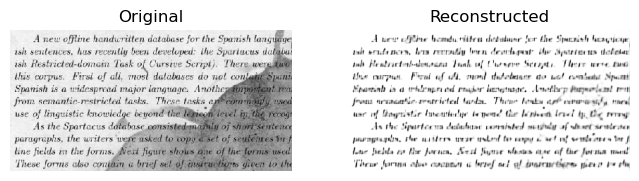

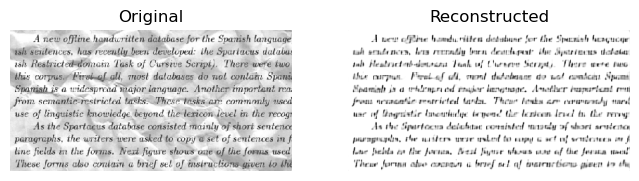

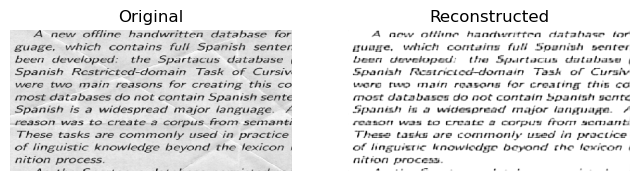

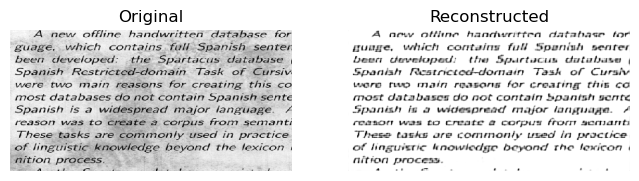

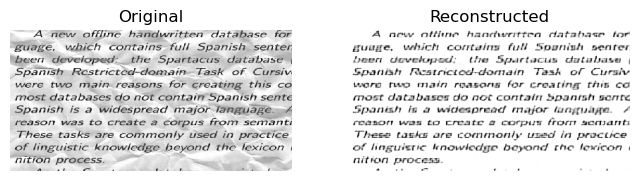

...

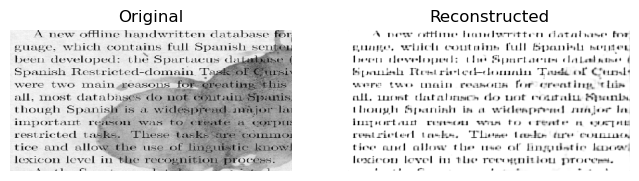

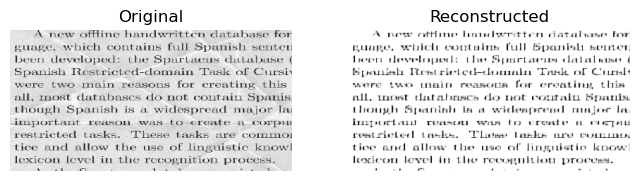

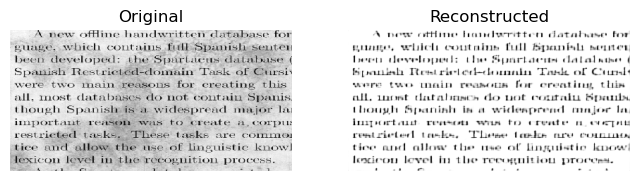

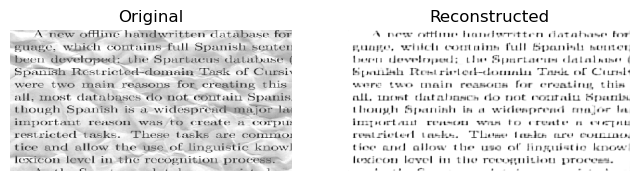

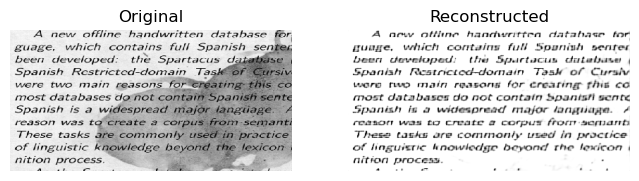

In [36]:
for i in range(len(test_images)):
    plt.figure(figsize=(8, 4))
    # Imagen original
    plt.subplot(1, 2, 1)
    plt.imshow(test_images[i].reshape(200, 400), cmap='gray')
    plt.title("Original")
    plt.axis('off')

    # Imagen reconstruida
    plt.subplot(1, 2, 2)
    plt.imshow(decoded_imgs[i].reshape(200, 400), cmap='gray')
    plt.title("Reconstructed")
    plt.axis('off')

    plt.show()